# HAM10000: Neural Networks for Skin Lesion Classification


> "Training of neural networks for automated diagnosis of pigmented skin lesions is hampered by the small size and lack of diversity of available datasets of dermatoscopic images. We tackle this problem by releasing the HAM10000 (“Human Against Machine with 10000 training images”) dataset."<br>
[Tschandl, P., Rosendahl, C. & Kittler, H. The HAM10000 dataset, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. Sci. Data 5, 180161 doi:10.1038/sdata.2018.161 (2018)](https://www.nature.com/articles/sdata2018161).

This notebook explores the HAM10000 dataset.

## Contents:
1. [Overview](#scrollTo=3rLOtadpMOCb&line=1&uniqifier=1)<br>
    1. [Content](#scrollTo=u4sM78zGoHrW)<br>
    2. [Acknowledgements](#scrollTo=uA6KhW5OoFEm)<br>
2. [The Data](#scrollTo=UoyeGfaWMOCc)<br>
    1. [RGB Analysis](#scrollTo=qtuXe1f0MOCe&line=1&uniqifier=1)
    2. [Melanoma-Malignant Cancer Analysis](#scrollTo=2aJFlw02MOCf)

# **1. Overview**

Dermatoscopy is a diagnostic technique that can improve the diagnosis of benign and malignant pigmented skin lesions. Other than increasing the accuracy of skin cancer detection (if compared to naked eye exams), dermatoscopic images can also be used to train ANN. In the past, promising attempts have been made to use ANN to classify skin lesions. However, the lack of data and computing power limited the application of this method.

The [ISIC archive](https://isic-archive.com/) is the largest public database for dermatoscopic image analysis research, and where the original HAM10000 was made available. In 2018, the database contained approximately 13.000 dermatoscopic images. Currently, the database holds over 60.000 images, demonstrating the power of collaboration between different scientific groups. 

As mentioned by the authors, the original paper and release of HAM10000 aimed to boost the research on the automated diagnosis of dermatoscopic images. We can say they have certainly achieved that goal after three successful challenges and an impressive expansion of the database.

## 1.1. Content ##
The HAM10000 dataset is composed of 10.015 dermatoscopic images of pigmented skin lesions. The data was collected from Australian and Austrian patients. Two institutions participated in providing the images: Cliff Rosendahl in Queensland, Australia, and Medical University of Vienna, Austria. According to the authors, seven classes are defined on this dataset where some diagnosis were unified into one class for simplicity. Information regarding patient age, sex, lesion location and diagnosis is also provided with each image.

## 1.2. Acknowledgements ##
The dataset has been collated and published by [Tschandl, P., Rosendahl, C. & Kittler, H.](https://www.nature.com/articles/sdata2018161)

In [1]:
config = {
    "to_unzip": False,
}

# Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from glob import glob
from PIL import Image
from pathlib import Path
from zipfile import ZipFile
from typing import List

%matplotlib inline
np.random.seed(123)

# 2. The Data

In this section, we analyse our metadata and understand a bit more regarding the patients and dataset distribution. 

## Key Insights

* Small number of Missing Values, only for Age features where replacement with most frequent value was used
* Similar distribution between Males and Females
* Melanocytic nevi is the dominant class in the dataset (67%). It could result in a bias towards this type of os skin lesion
* Most samples are from patients within 35 - 60 yrs old
* Melanoma, malignant skin lesion, seems to be more common in the ages of 45 to 70. Males represent 62% of the incidence of this type of lesion

A sample of each type of skin lesion present in the dataset is demonstrated in the chart below.

In [3]:
def basic_info(df):
    size = df.shape
    sum_duplicates = df.duplicated().sum()
    sum_null = df.isnull().sum().sum()
    is_NaN = df.isnull()
    row_has_NaN = is_NaN.any(axis=1)
    rows_with_NaN = df[row_has_NaN]
    count_NaN_rows = rows_with_NaN.shape
    print(
        f"""Number of samples: {size[0]}
Number of features: {size[1]}
Duplicated entries: {sum_duplicates}
Null entries: {sum_null}
Number of rows with null entries: {count_NaN_rows[0]} {(count_NaN_rows[0] / size[0]) * 100:.2f}%""")


def summary_table(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Missing'] = df.isnull().sum().values
    summary['Uniques'] = df.nunique().values
    return summary


def countplot(df, x, x_axis_title, y_axis_title, plot_title):
    plt.figure(figsize=(20, 8))
    sns.set(style='ticks', font_scale=1)
    ax = sns.countplot(data=df, x=x, order=df[x].value_counts().index)
    sns.despine(top=True, right=True, left=True, bottom=False)
    plt.xticks(rotation=0, fontsize=12)
    ax.set_xlabel(x_axis_title, fontsize=14, weight='bold')
    ax.set_ylabel(y_axis_title, fontsize=14, weight='bold')
    plt.title(plot_title, fontsize=16, weight='bold')
    total = len(df)

    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size=12)

In [4]:
def connect_to_resources() -> str:
    try:
        from google.colab import drive, files

        drive.mount('/content/drive')
        print('Running on COLAB')
        return '/content/drive/MyDrive/final_project'
    except ModuleNotFoundError:
        print('Not running on COLAB')
        return ''


ROOT = connect_to_resources()

Not running on COLAB


In [5]:
IMAGE_ZIP_FILENAME = 'HAM10000.zip'
DATA_PATH = 'data'
METADATA_FILE_PATH = Path(ROOT, DATA_PATH, 'HAM10000_metadata.csv')
IMAGES_DIRECTORY = Path(DATA_PATH, 'HAM10000')

In [6]:
def get_class_names(_metadata_df: pd.DataFrame) -> List[str]:
    """get the class names from the metadata file"""
    return sorted(list(_metadata_df['dx'].str.lower().unique()))


def get_metadata_df(metadata_file_path: Path) -> pd.DataFrame:
    df = pd.read_csv(metadata_file_path)
    return df


metadata_df = get_metadata_df(METADATA_FILE_PATH)
class_names = get_class_names(metadata_df)
class_names

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

In [7]:
def preprocess() -> None:
    """Preprocess zip file: extract and split images into their class folder"""
    # Read the zip file and extract it
    with ZipFile(Path(ROOT, DATA_PATH, IMAGE_ZIP_FILENAME), 'r') as z:
        # Extracting all the files to PATH directory
        z.extractall(DATA_PATH)
        print('Zip file extracted')


if config['to_unzip']:
    preprocess()

In [8]:
# lesion dictionary
lesion_type_dict = {
    'nv': 'melanocytic nevi',
    'mel': 'melanoma',
    'bkl': 'benign keratosis-like lesions ',
    'bcc': 'basal cell carcinoma',
    'akiec': 'actinic keratosis',
    'vasc': 'vascular lesions',
    'df': 'dermatofibroma'
}

# dictionary for image names
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x for x in
                     glob(os.path.join(IMAGES_DIRECTORY, '*', '*.jpg'))}

skin_df = metadata_df.copy()

# create useful columns - images path, lesion type and lesion categorical code
skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get)
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

for c in ['dx', 'dx_type', 'sex', 'localization', 'dataset', 'cell_type']:
    skin_df[c] = skin_df[c].astype('category')

skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0027419.jpg,benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0025030.jpg,benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0026769.jpg,benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0025661.jpg,benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,data\HAM10000\bkl\ISIC_0031633.jpg,benign keratosis-like lesions,2


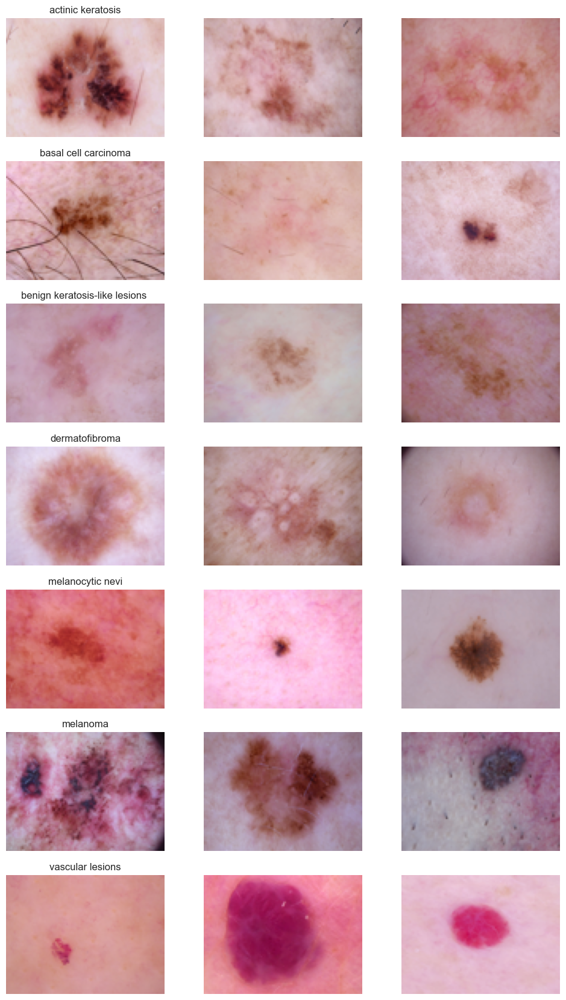

In [10]:
img = skin_df.sample(n=500, replace=False, random_state=1)
img['image'] = img['path'].map(lambda x: np.asarray(Image.open(x).resize((100, 75))))
# image sampling
n_samples = 3

fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))

for n_axs, type_info in zip(m_axs, img.sort_values(['cell_type']).groupby('cell_type')):
    type_name, type_rows = type_info
    n_axs[0].set_title(type_name)

    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

The CSV file contains originally seven features. In the code lines above we add a few columns to support the data analysis and facilitate the extraction of images later on. The null entries are only related to the Age feature, as such no major data cleanse is required as the dataset is pretty much ready to use.

In [11]:
basic_info(skin_df)

Number of samples: 10015
Number of features: 11
Duplicated entries: 0
Null entries: 57
Number of rows with null entries: 57 0.57%


In [12]:
summary_table(skin_df)

,Name,dtypes,Missing,Uniques
0,lesion_id,object,0,7470
1,image_id,object,0,10015
2,dx,category,0,7
3,dx_type,category,0,4
4,age,float64,57,18
5,sex,category,0,3
6,localization,category,0,15
7,dataset,category,0,4
8,path,object,0,10015
9,cell_type,category,0,7


The summary helps to understand the type of metadata collected. We noticed that for some lesions there must be more than one image as the lesion and image ID do not match. The Uniques columns also indicate the number of classes (dx = 7), and how the age, sex and localization features were organized.

All the features are pretty much self-explanatory. To clarify, the **dx_type** column is the technique used to identify the type of skin lesion.

The count plots below help to understand the distribution of the data.

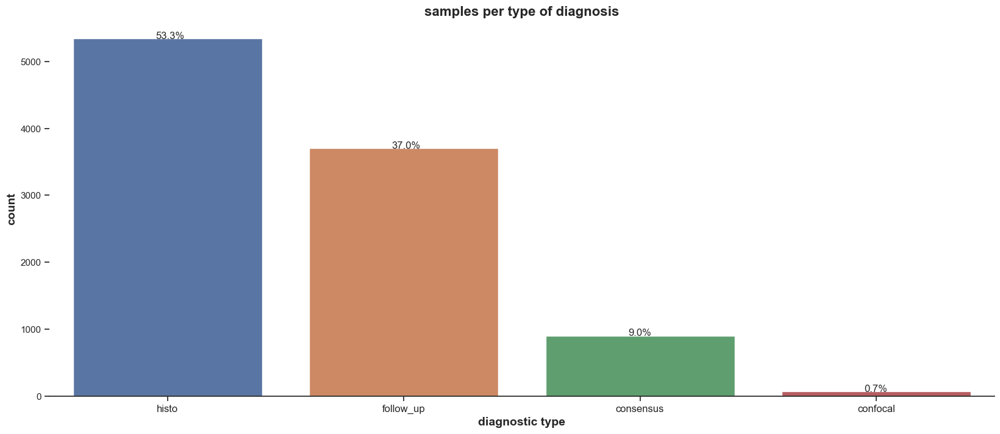

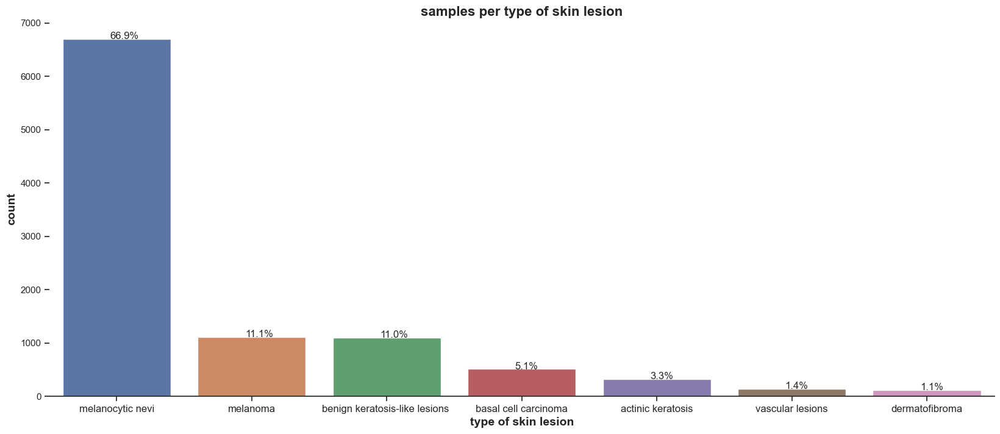

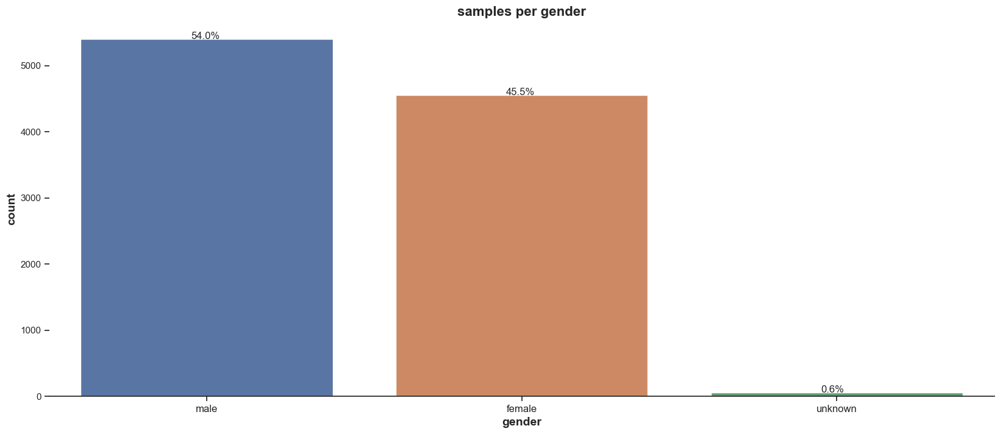

In [13]:
countplot(skin_df, 'dx_type', 'diagnostic type', 'count', 'samples per type of diagnosis')
countplot(skin_df, 'cell_type', 'type of skin lesion', 'count', 'samples per type of skin lesion')
countplot(skin_df, 'sex', 'gender', 'count', 'samples per gender')

* The main thing to keep in mind is the unbalance between the different classes of skin lesion. Approximately 67% of data accounts for Melanocytic Nevi samples
* The least represented classes are Dermatofibroma lesions and Vascular skin lesions, with only 115 and 142 samples, respectively
* The samples are mostly Male participants, approximately 55%, not a significant difference between Genders

Text(0.5, 1.0, 'Age Distribution')

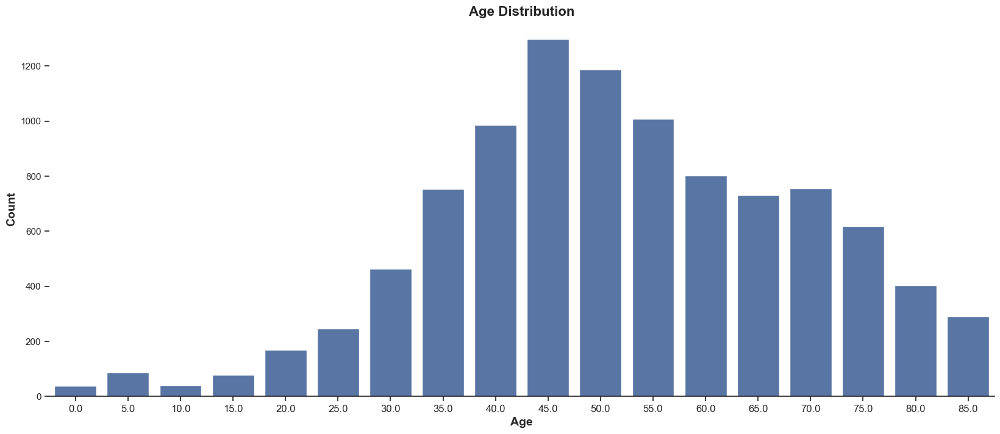

In [14]:
skin_df['age'].fillna((skin_df['age'].mode()), inplace=True)

plt.figure(figsize=(20, 8))
sns.set(style='ticks', font_scale=1)
ax = sns.countplot(data=skin_df, x='age', color='b')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0, fontsize=12)
ax.set_xlabel('Age', fontsize=14, weight='bold')
ax.set_ylabel('Count', fontsize=14, weight='bold')
plt.title('Age Distribution', fontsize=16, weight='bold')

* The samples are predominantly from patients within 40 - 55 years old
* The number of samples rises sharply after 25 years old, doubling the samples for 30 years old and almost doubling again for 35 years old
* Between the ages of 60 - 70 years old the number of samples remain almost stable, returning to the downward trend after 75 years old

## Localization analysis
We want to understand the distribution of the samples across the body. The localization feature is the body area where the skin lesion is located. The count plot below shows the distribution of the samples across the areas of the body in which all types of skin lesion appears in the dataset.

Meaning, from all the localization values, we want to know which ones have all the types of skin lesion. The list of areas with all the types of skin lesion is `['abdomen', 'back', 'lower extremity', 'upper extremity']` and they are the ones we will use to filter the dataset.
The plot shows how the samples are distributed across these areas.

In [61]:
dx_count = metadata_df.groupby('localization')['dx'].nunique()
dx_count = pd.DataFrame(dx_count)
areas_with_all_lesion_types = list(dx_count[dx_count['dx'] == 7].index.values)
print(areas_with_all_lesion_types)

['abdomen', 'back', 'lower extremity', 'upper extremity']


In [59]:
# Create a boolean mask to select rows where 'localization' is in the list ['abdomen', 'back', 'lower extremity', 'upper extremity']
mask = metadata_df['localization'].isin(areas_with_all_lesion_types)

# Use the boolean mask to filter the DataFrame
filtered_df = metadata_df[mask].copy()

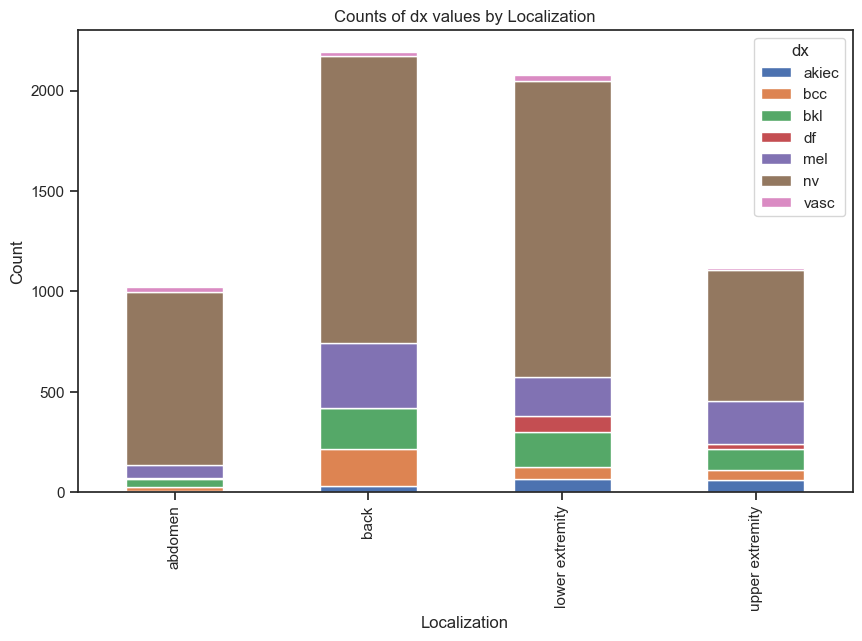

In [60]:
counts = filtered_df.groupby(['localization', 'dx'])['dx'].count()

# Reshape the data to create a pivot table with 'dx' values as columns and 'localization' values as rows
counts = counts.unstack(level=1)

# Plot the stacked bar chart
ax = counts.plot(kind='bar', stacked=True, figsize=(10,6))

# Set the labels and title of the chart
ax.set_xlabel('Localization')
ax.set_ylabel('Count')
ax.set_title('Counts of dx values by Localization')

# Show the plot
plt.show()

## 2.1. RGB analysis
https://www.kaggle.com/code/kmader/skin-images-to-features/data

In [16]:
skin_df.describe(exclude=[np.number])

,lesion_id,image_id,dx,dx_type,sex,localization,dataset,path,cell_type
count,10015,10015,10015,10015,10015,10015,10015,10015,10015
unique,7470,10015,7,4,3,15,4,10015,7
top,HAM_0003789,ISIC_0027419,nv,histo,male,back,vidir_molemax,data\HAM10000\bkl\ISIC_0027419.jpg,melanocytic nevi
freq,6,1,6705,5340,5406,2192,3954,1,6705


In [17]:
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0027419.jpg,benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0025030.jpg,benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0026769.jpg,benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,data\HAM10000\bkl\ISIC_0025661.jpg,benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,data\HAM10000\bkl\ISIC_0031633.jpg,benign keratosis-like lesions,2


In [18]:
rgb_info_df = img.apply(lambda x:
                        pd.Series({'{}_mean'.format(k): v for k, v in
                                   zip(['Red', 'Green', 'Blue'],
                                       np.mean(x['image'], (0, 1)))}), 1)
gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)

for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col] / gray_col_vec

rgb_info_df['Gray_mean'] = gray_col_vec
rgb_info_df.sample(3)

,Red_mean,Green_mean,Blue_mean,Gray_mean
473,1.183010,0.888242,0.928749,168.506267
9153,1.117575,0.957429,0.924996,151.978489
1601,1.123555,0.836447,1.039998,151.217022


In [19]:
for c_col in rgb_info_df.columns:
    img[c_col] = rgb_info_df[c_col].values

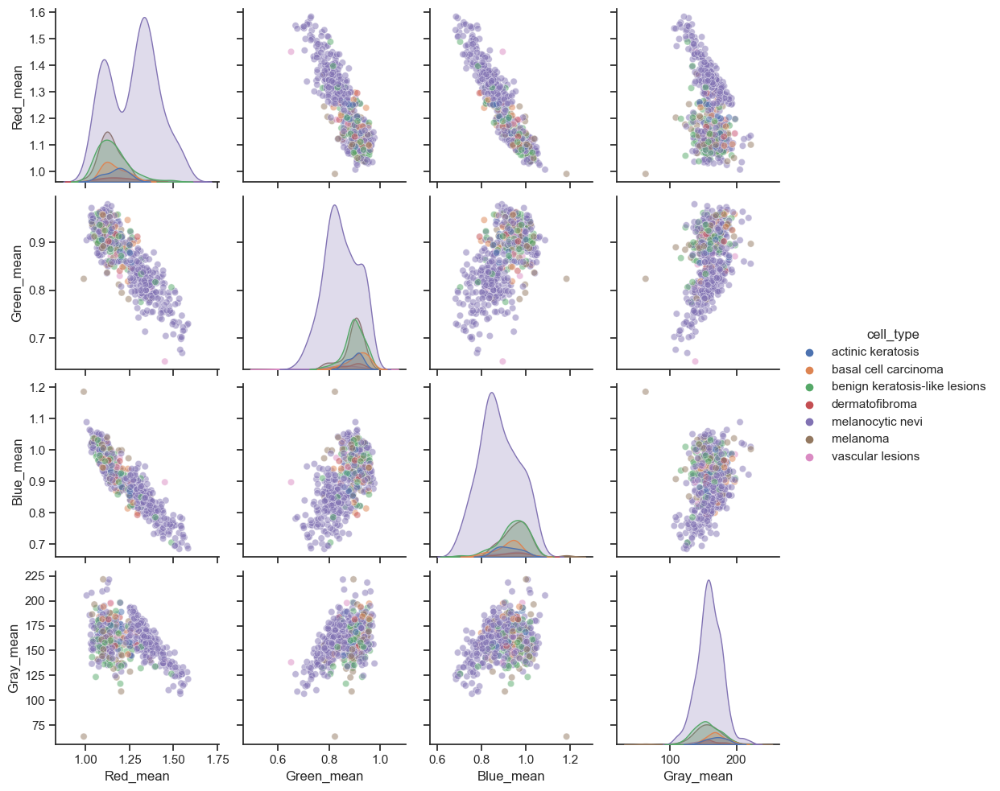

In [20]:
sns.pairplot(img[['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean', 'cell_type']],
             hue='cell_type',
             plot_kws={'alpha': 0.5})

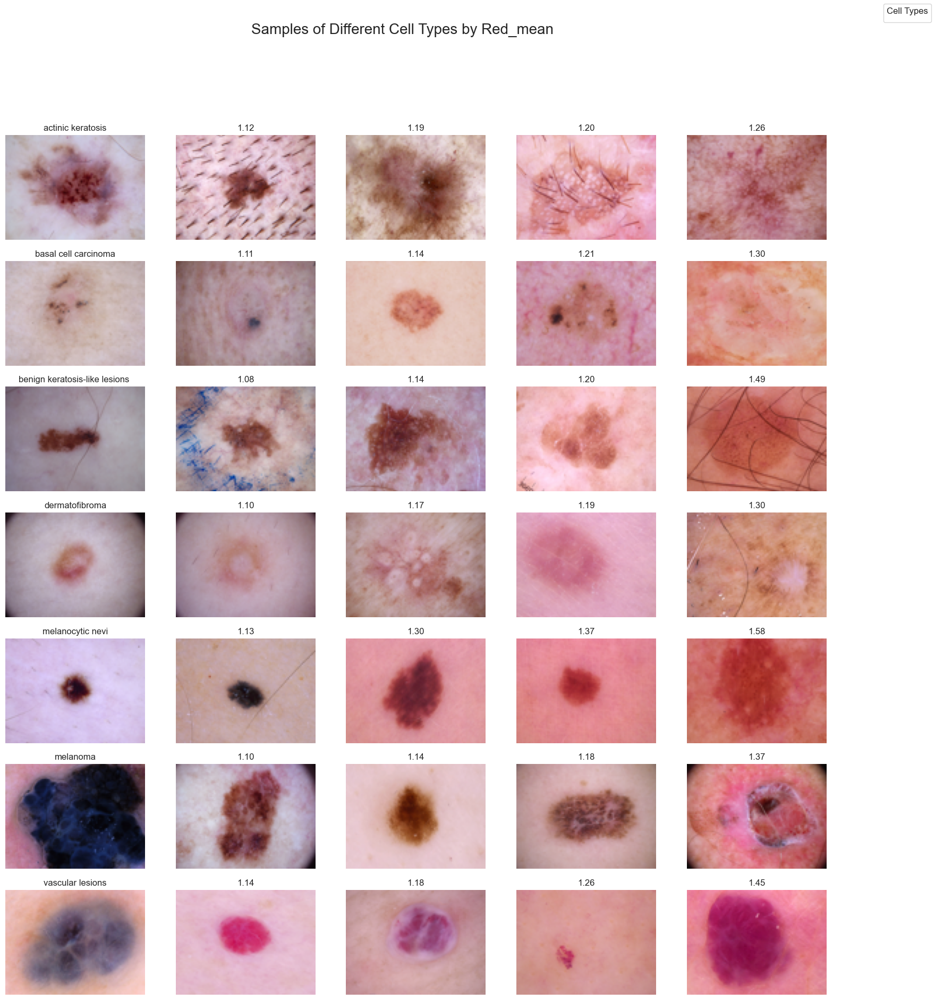

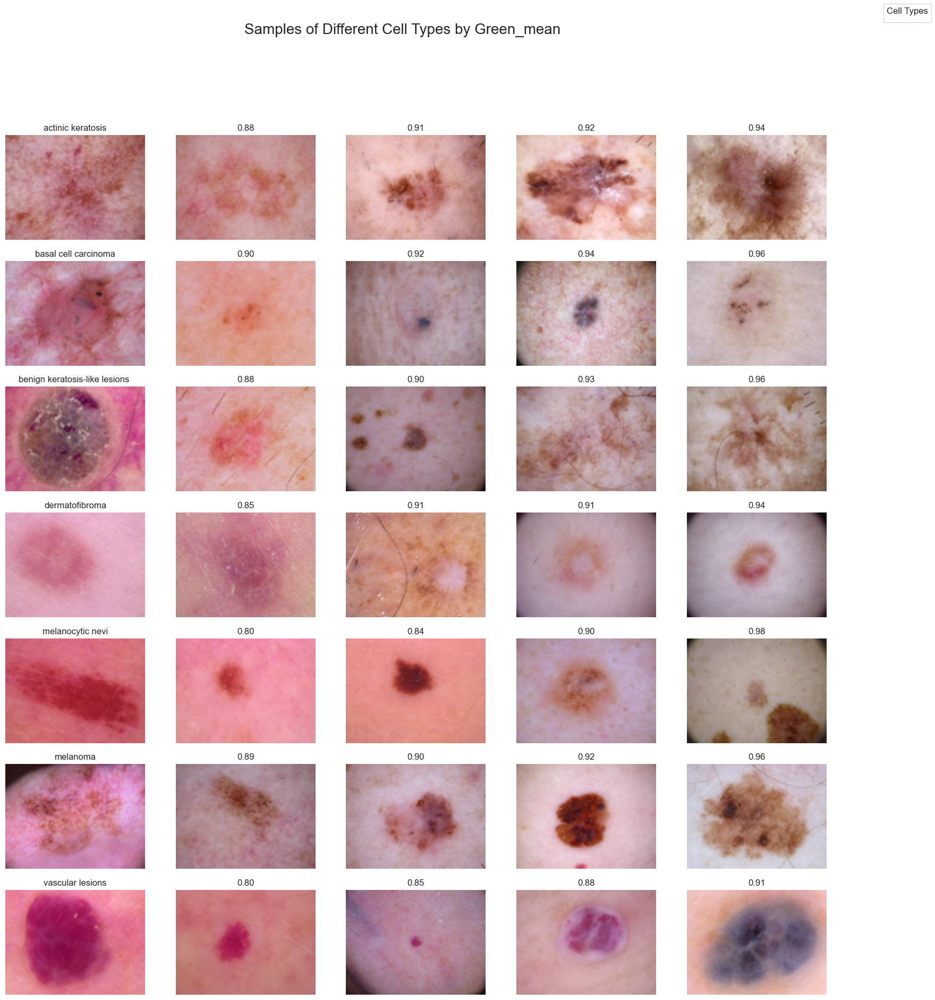

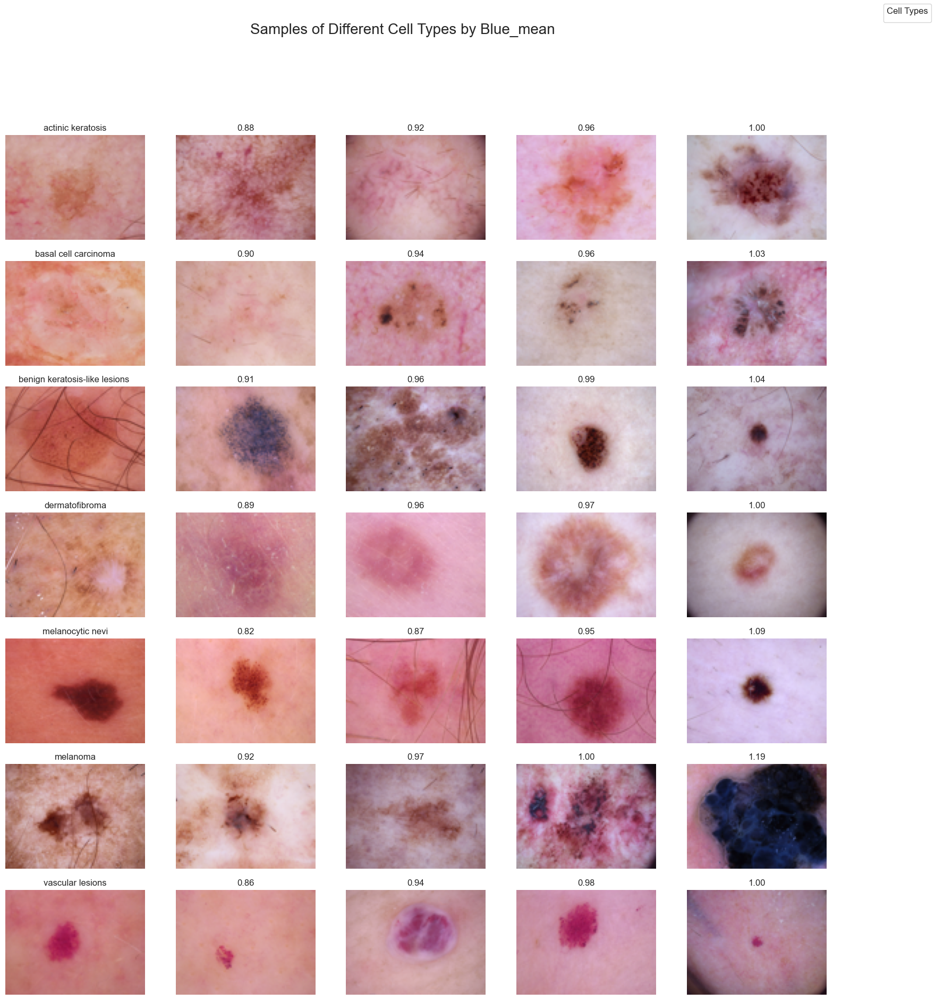

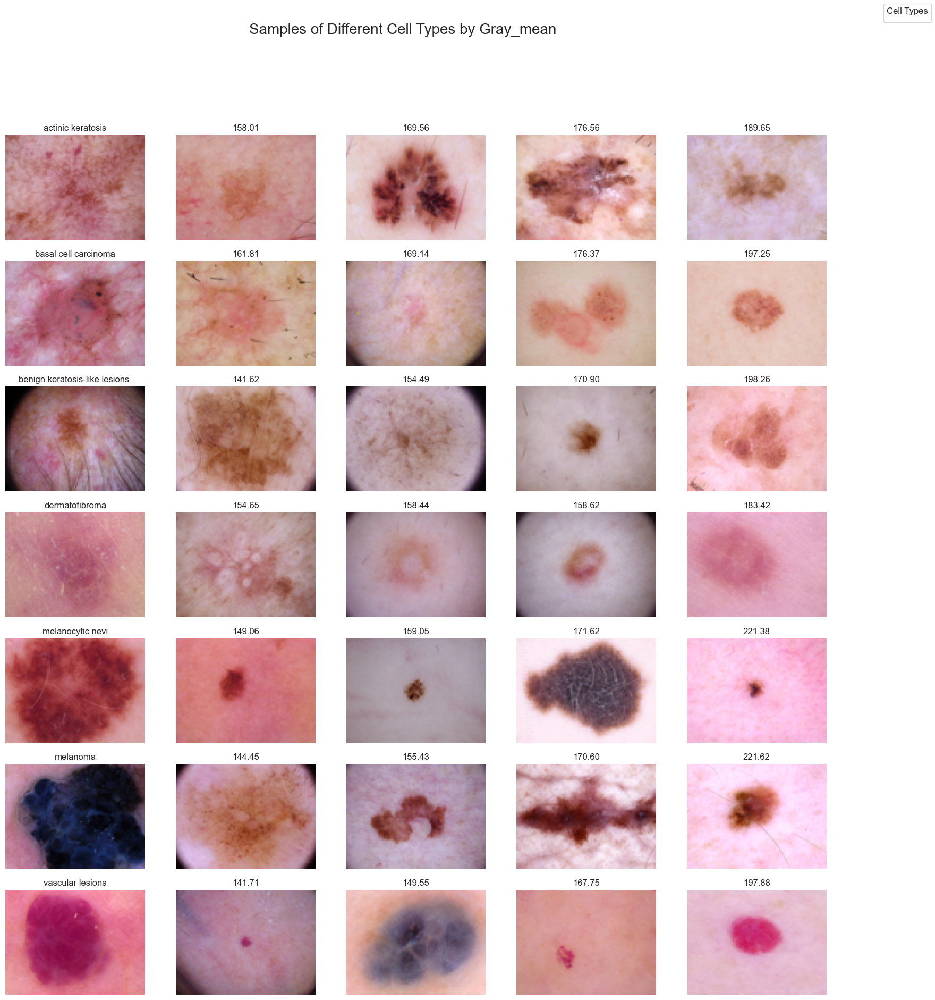

In [21]:
n_samples = 5

for sample_col in ['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean']:
    fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))


    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0] - 1, n, dtype=int)
        return s_rows.iloc[s_idx]


    for n_axs, (type_name, type_rows) in zip(m_axs, img.sort_values(['cell_type']).groupby('cell_type')):
        for c_ax, (_, c_row) in zip(n_axs, take_n_space(type_rows, sample_col, n_samples).iterrows()):
            c_ax.imshow(c_row['image'])
            c_ax.axis('off')
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))

        n_axs[0].set_title(type_name)

    fig.suptitle('Samples of Different Cell Types by {}'.format(sample_col), fontsize=20)

    for ax in m_axs.flatten():
        ax.set_xlabel('X-axis')
        ax.set_ylabel('Y-axis')

    fig.legend(img['cell_type'].unique(), title='Cell Types', loc='upper right')
    # fig.savefig('{}_samples.png'.format(sample_col), dpi=300)

## 2.2. Melanoma


The only malignant type of skin lesion present on this dataset is Malignant Melanoma, where surgical removal in the early stage of cancer can provide a cure. The remaining skin lesions are benign even though they may require treatment.

In this segment, we make a quick analysis of Melanoma skin lesions.

*** KEEP IN MIND - the distributions are relevant for the dataset alone, are not normalized and are not necessarily the ground truth for the whole population.

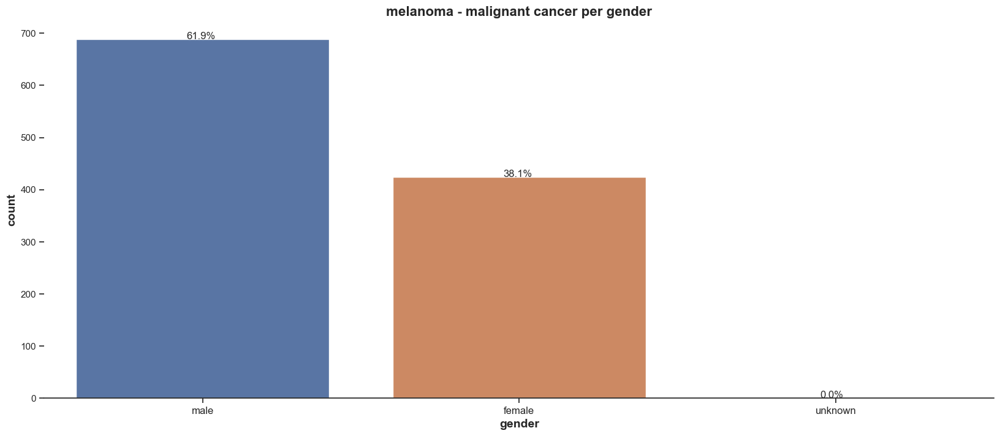

In [22]:
skin_mel = skin_df.loc[:, ['age', 'sex', 'localization', 'cell_type']]
skin_mel = skin_mel[skin_mel['cell_type'] == 'melanoma']
countplot(skin_mel, 'sex', 'gender', 'count', 'melanoma - malignant cancer per gender')

* Regarding gender, in the previous section, we saw a similar distribution across the main two genders. However, considering only Melanoma we can see from the above plot that more than 60% of the cases reported are male.

Text(0.5, 1.0, 'Age distribution - Melanoma')

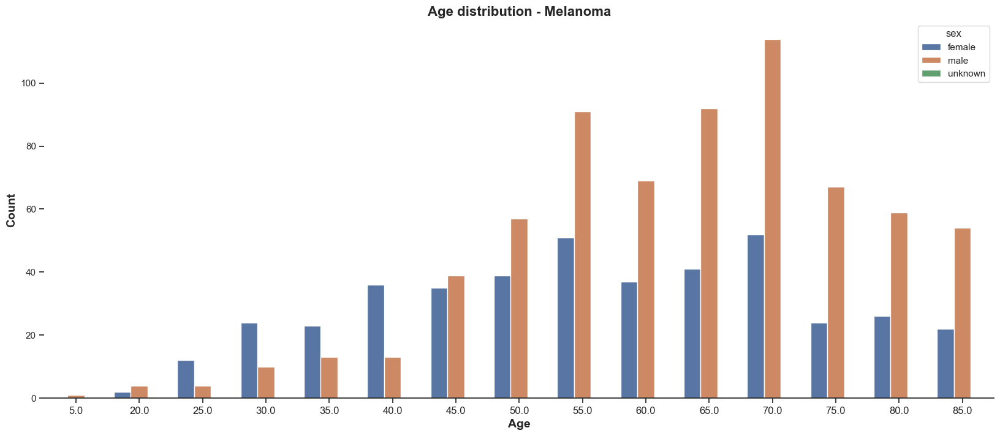

In [23]:
plt.figure(figsize=(20, 8))
sns.set(style='ticks', font_scale=1)
ax = sns.countplot(data=skin_mel, x='age', hue='sex')
sns.despine(top=True, right=True, left=True, bottom=False)
plt.xticks(rotation=0, fontsize=12)
ax.set_xlabel('Age', fontsize=14, weight='bold')
ax.set_ylabel('Count', fontsize=14, weight='bold')
plt.title('Age distribution - Melanoma', fontsize=16, weight='bold')

* The age distribution is quite different for Melanoma diagnostic when compared to the whole dataset
* For both genders, there are two distinct peaks, at 55 and 70 years old. The peaks could be related to the period people usually do a full health check-up
* Younger Melanoma patients are more likely to be females - a significant difference of gender for the ages 25 - 40
* For males, melanoma has a higher incidence in older ages
* After 40 years of age, the number of cases for females seems to stabilize. The peaks at 55 and 70 years old are not as expressive as the male patients

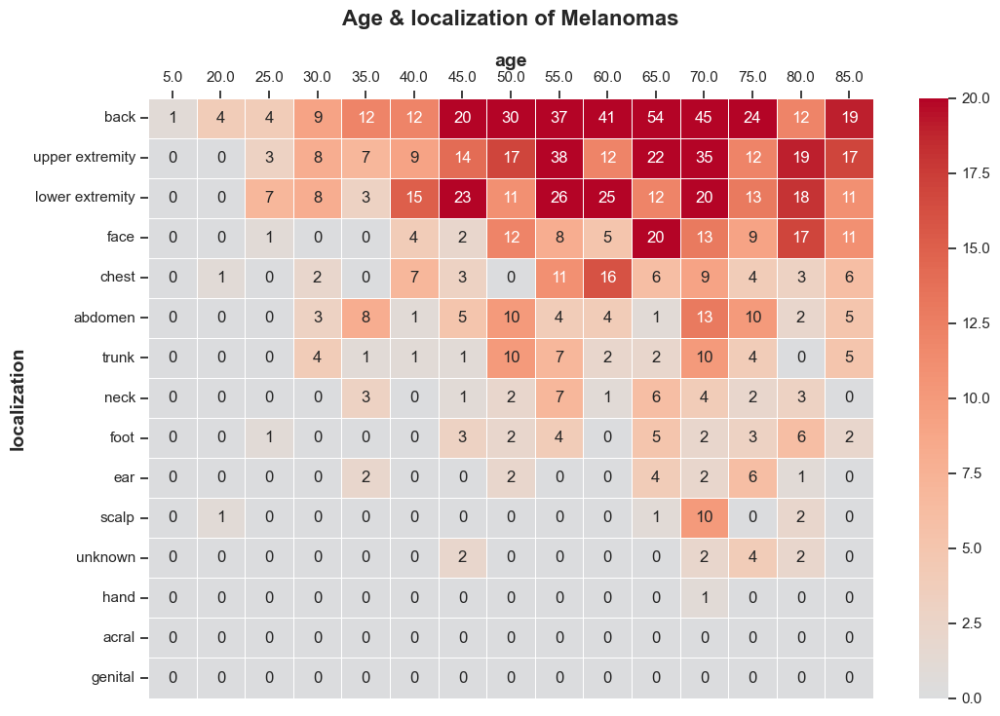

In [24]:
skin_local = skin_mel.groupby(['localization']).size().sort_values(ascending=False, inplace=False).reset_index()
skin_local.columns = ['localization', 'count']
sort_by = skin_local['localization']

skin_heat = skin_mel.groupby(['age', 'localization']).size().reset_index()
skin_heat.columns = ['age', 'localization', 'count']
skin_heat.sort_values('count', ascending=False, inplace=True)


def heatmap(df, index, columns, values, vmax, sort_by, title):
    df_wide = df.pivot(index=index, columns=columns, values=values)
    df_wide = df_wide.reindex(index=sort_by)
    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(df_wide, annot=True, fmt='.0f', yticklabels='auto',
                     cmap=sns.color_palette('coolwarm', as_cmap=True),
                     center=.2, vmin=0, vmax=vmax, linewidths=.5)
    ax.xaxis.tick_top()  # x-axis on top
    ax.xaxis.set_label_position('top')
    ax.set_xlabel(columns, fontsize=14, weight='bold')
    ax.set_ylabel(index, fontsize=14, weight='bold')
    ax.set_title(title, fontsize=16, weight='bold', pad=20)
    plt.show()


heatmap(skin_heat, 'localization', 'age', 'count', 20, sort_by, 'Age & localization of Melanomas')

* The heatmap makes a good representation of how age influences cancer incidence. Note the cluster between the ages of 45 to 70.
* Back, upper and lower extremities are the most common locations of this melanoma. For the age group of 50 and 70 years old, the face, abdomen, chest and trunk also present a higher number of incidence.
* The scalp seems to be a more common localization only for 70 year-olds.
* The localizations do not seem to be related to the parts of the body most commonly exposed to the sun. If it was the case, scalp, hands and face should have a higher incidence.